In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (5,482 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [ ]:
import pytesseract

In [ ]:
# !pip install Pillow

In [ ]:
!pip install pdf2image

In [ ]:
!apt-get install -y poppler-utils


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  poppler-utils
0 upgraded, 1 newly installed, 0 to remove and 49 not upgraded.
Need to get 186 kB of archives.
After this operation, 696 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 poppler-utils amd64 22.02.0-2ubuntu0.5 [186 kB]
Fetched 186 kB in 1s (311 kB/s)
Selecting previously unselected package poppler-utils.
(Reading database ... 123681 files and directories currently installed.)
Preparing to unpack .../poppler-utils_22.02.0-2ubuntu0.5_amd64.deb ...
Unpacking poppler-utils (22.02.0-2ubuntu0.5) ...
Setting up poppler-utils (22.02.0-2ubuntu0.5) ...
Processing triggers for man-db (2.10.2-1) ...


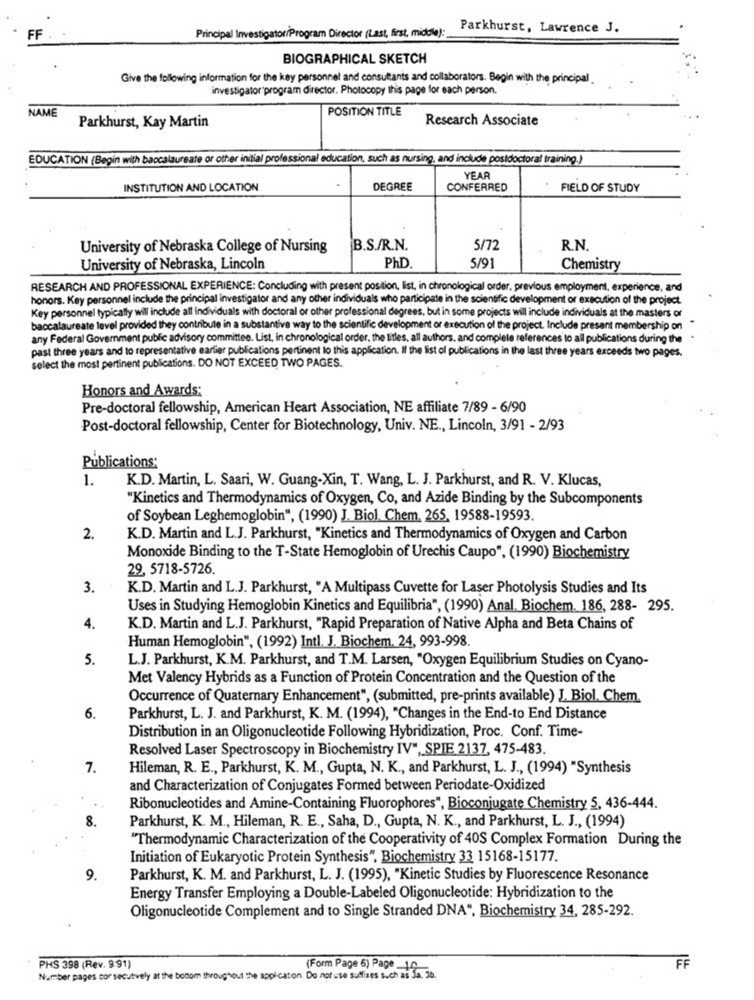

In [ ]:
from PIL import Image, ImageDraw, ImageFont
from pdf2image import convert_from_path

pages = convert_from_path('/content/drive/My Drive/Dataset_Appian/resume24.pdf')
image = pages[0]
image = image.convert("RGB")
image

We can use the Tesseract OCR engine to turn the image into a list of recognized words:

In [ ]:
!tesseract --version

tesseract 4.1.1
 leptonica-1.82.0
  libgif 5.1.9 : libjpeg 8d (libjpeg-turbo 2.1.1) : libpng 1.6.37 : libtiff 4.3.0 : zlib 1.2.11 : libwebp 1.2.2 : libopenjp2 2.4.0
 Found AVX512BW
 Found AVX512F
 Found AVX2
 Found AVX
 Found FMA
 Found SSE
 Found libarchive 3.6.0 zlib/1.2.11 liblzma/5.2.5 bz2lib/1.0.8 liblz4/1.9.3 libzstd/1.4.8


In [ ]:
import pytesseract
import numpy as np
pytesseract.pytesseract.tesseract_cmd = '/usr/bin/tesseract'
ocr_df = pytesseract.image_to_data(image, output_type='data.frame')

ocr_df = ocr_df.dropna().reset_index(drop=True)
float_cols = ocr_df.select_dtypes('float').columns
ocr_df[float_cols] = ocr_df[float_cols].round(0).astype(int)
ocr_df = ocr_df.replace(r'^\s*$', np.nan, regex=True)
words = ' '.join([word for word in ocr_df.text if str(word) != 'nan'])
words





'” FF Principal Investigator/Program Director (Last, fst, mid): Parkhurst, Lawrence J, BIOGRAPHICAL SKETCH Give the following information for the key personnel and consuftants and collaborators. Bagin with the principal _ investigator program director. Photocopy this page for each person. = Parkhurst, Kay Martin eo rm TELE Research Associate EDUCATION (Begin with baccalaureate or other initial professional education, such as nursing, and include posidoctora! training.) YEAR INSTITUTION AND LOCATION i CONFERRED University of Nebraska College of Nursing University of Nebraska, Lincoln RESEARCH AND PROFESSIONAL EXPERIENCE: Concluding with present position, list, in chronological order, previous employment, experience, and honors. Key personnel include the principal investigator and any other individuals who participate in the scientific development or execution of the project Key personne! typically will inctude all individuals with doctoral or other professional degrees, but in some proj

We can also visualize the bounding boxes of the recognized words, as follows:

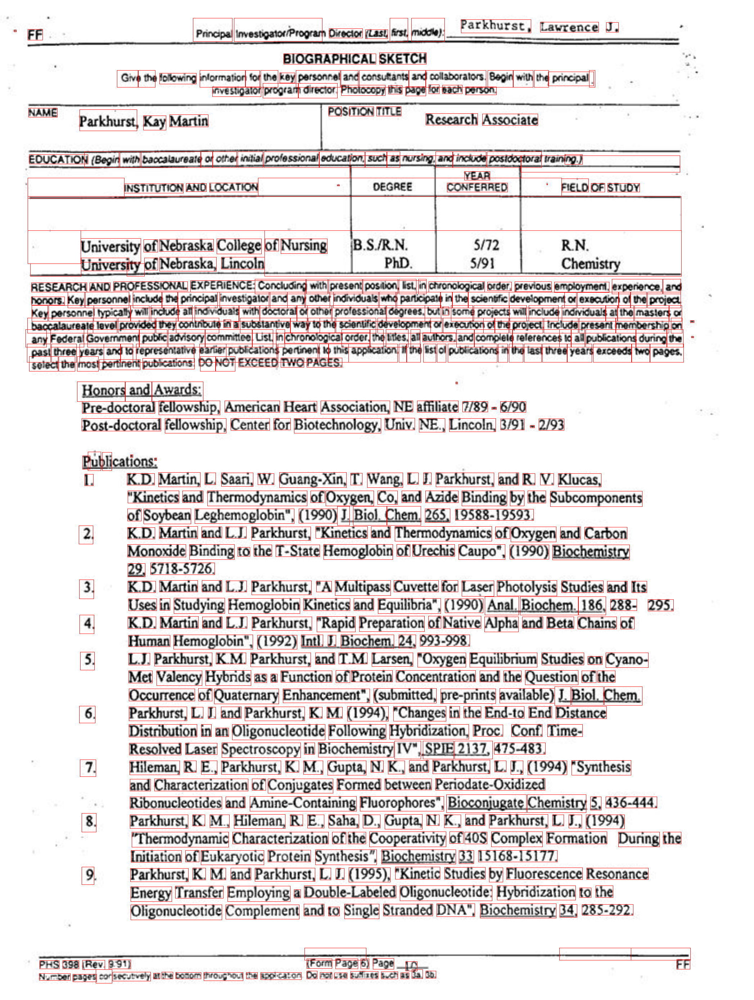

In [ ]:
coordinates = ocr_df[['left', 'top', 'width', 'height']]
actual_boxes = []
for idx, row in coordinates.iterrows():
    x, y, w, h = tuple(row) # the row comes in (left, top, width, height) format
    actual_box = [x, y, x+w, y+h] # we turn it into (left, top, left+width, top+height) to get the actual box
    actual_boxes.append(actual_box)

draw = ImageDraw.Draw(image, "RGB")
for box in actual_boxes:
  draw.rectangle(box, outline='red')

image

## Preprocessing the data using 🤗 datasets

First, we convert the dataset into a Pandas dataframe, having 2 columns: `image_path` and `label`.

In [ ]:
import os
import pandas as pd

In [ ]:
!ls /content/drive/

MyDrive


In [ ]:
import os
data_path = '/content/drive/My Drive/Dataset_Appian'

# Verify if the path exists
if os.path.exists(data_path):
    print("Path exists!")
else:
    print("Path does not exist!")

Path exists!


In [ ]:
labels = ['resume', 'invoice', 'balance_sheet', 'Driving_License', 'Income_Statement', 'passport', 'Tax_Statement', ]
data_dict = {'file_path': [], 'label': []}
data_path = '/content/drive/My Drive/Dataset_Appian/'

for file in os.listdir(data_path):
    file_path = data_path + file

    # pages = convert_from_path(file_path, poppler_path='C:/Users/palak/Desktop/.vscode/poppler-24.08.0/Library/bin')
    # image = pages[0]
    # image = image.convert("RGB")


    for i in labels:
        if i in file:
            label = i
            break
    else:
        continue

    data_dict['file_path'].append(file_path)
    data_dict['label'].append(label)

data = pd.DataFrame(data_dict)
data.head()

,file_path,label
0,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet
1,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet
2,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet
3,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet
4,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet


In [ ]:
data

,file_path,label
0,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet
1,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet
2,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet
3,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet
4,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet
...,...,...
164,/content/drive/My Drive/Dataset_Appian/Tax_Sta...,Tax_Statement
165,/content/drive/My Drive/Dataset_Appian/Tax_Sta...,Tax_Statement
166,/content/drive/My Drive/Dataset_Appian/Tax_Sta...,Tax_Statement
167,/content/drive/My Drive/Dataset_Appian/Tax_Sta...,Tax_Statement


In [ ]:
len(data)

169

Now, let's apply OCR to get the words and bounding boxes of every image. To do this efficiently, we turn our Pandas dataframe into a HuggingFace `Dataset` object, and use the `.map()` functionality to get the words and normalized bounding boxes of every image. Note that this can take a while to run (Tesseract seems a bit slow).

In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 18.7 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
from datasets import Dataset

def normalize_box(box, width, height):
     return [
         int(1000 * (box[0] / width)),
         int(1000 * (box[1] / height)),
         int(1000 * (box[2] / width)),
         int(1000 * (box[3] / height)),
     ]

def apply_ocr(example):
        # get the image
        image = convert_from_path(example['file_path'])[0]

        width, height = image.size

        # apply ocr to the image
        ocr_df = pytesseract.image_to_data(image, output_type='data.frame')
        float_cols = ocr_df.select_dtypes('float').columns
        ocr_df = ocr_df.dropna().reset_index(drop=True)
        ocr_df[float_cols] = ocr_df[float_cols].round(0).astype(int)
        ocr_df = ocr_df.replace(r'^\s*$', np.nan, regex=True)
        ocr_df = ocr_df.dropna().reset_index(drop=True)

        # get the words and actual (unnormalized) bounding boxes
        #words = [word for word in ocr_df.text if str(word) != 'nan'])
        words = list(ocr_df.text)
        words = [str(w) for w in words]
        coordinates = ocr_df[['left', 'top', 'width', 'height']]
        actual_boxes = []
        for idx, row in coordinates.iterrows():
            x, y, w, h = tuple(row) # the row comes in (left, top, width, height) format
            actual_box = [x, y, x+w, y+h] # we turn it into (left, top, left+width, top+height) to get the actual box
            actual_boxes.append(actual_box)

        # normalize the bounding boxes
        boxes = []
        for box in actual_boxes:
            boxes.append(normalize_box(box, width, height))

        # add as extra columns
        assert len(words) == len(boxes)
        example['words'] = words
        example['bbox'] = boxes
        return example

dataset = Dataset.from_pandas(data)
updated_dataset = dataset.map(apply_ocr)

Map:   0%|          | 0/169 [00:00<?, ? examples/s]

In [ ]:
updated_dataset

Dataset({
    features: ['file_path', 'label', 'words', 'bbox'],
    num_rows: 169
})

In [ ]:
import pandas as pd
df = pd.DataFrame.from_dict(updated_dataset)
#print(len(df["words"][5]))
print(df["words"][0])

['Statement', 'of', 'Assets', 'and', 'Liabilities', '(Standalone', '-', 'e———_—_', 'Rs.', 'in', 'Lakhs', '[.t~<“—sOOSOCSSS', 'lAsat', 'sid', '[Asat', '—=S*Y(AS', 'at', '—', 'sce', 'ap', 'March', 'Particulars', '\\31', 'March', '2018', '2017', 'f', 't~—“SO::”:”””:”C~*:*«iitled)', '(Audited)', 'ASSETS', 'es', '—', 'ASSETS', 'es', '—', '\\Non-current', 'a', 'assets', '[Property,', 'plant', 'and', 'equipment', '(218.80', '3', 'Other', 'intangible', 'assets', '8.79', '[Financial', 'assets', 'Investments', '{660,', '210.2', '24', '|', '[Loans', '13,814.11', 'Deferred', 'tax', 'assets', '(net)', 'Non-current', 'tax', 'assets', '(net)', '9,', '693.82', 'Other', 'non-current', 'assets', '129.12', '[8,240.20', '‘Total', 'of', 'non-current', 'assets', '‘(692,315.08', '=', '36,', 'Current', 'assets', '|', '[inventories', '[7,132.76', ':', 'Financial', 'assets', 'lInvestments', '[29,338.84', '[Trade', 'receivables', '[185.19', '[Cash', 'and', 'cash', 'equivalents', '[1,360.51', '[Other', 'bank', 'b

In [ ]:
df.head(5)

,file_path,label,words,bbox
0,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet,"[Statement, of, Assets, and, Liabilities, (Sta...","[[12, 12, 87, 23], [92, 12, 107, 23], [111, 12..."
1,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet,"[[Statement, of, Assets, and, Liabilities, (Co...","[[10, 5, 87, 23], [92, 10, 107, 19], [111, 10,..."
2,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet,"[[, |, Standalone, [Consolidated, |, [|], |, ‘...","[[3, 6, 21, 30], [21, 8, 43, 28], [538, 6, 614..."
3,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet,"[|, |(a), Property,, Plant, and, Equipment, ],...","[[10, 113, 32, 129], [32, 113, 61, 129], [67, ..."
4,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet,"[[Standalone, (Rs., In, Cr), (Consolidated, (R...","[[419, 6, 506, 26], [511, 11, 544, 23], [549, ..."


In [ ]:
df = df[df['words'].apply(lambda x: x != [])]
df = df[df['bbox'].apply(lambda x: x != [])]

# Reset the index of the DataFrame
df = df.reset_index(drop=True)

In [ ]:
df.head(5)

,file_path,label,words,bbox
0,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet,"[Statement, of, Assets, and, Liabilities, (Sta...","[[12, 12, 87, 23], [92, 12, 107, 23], [111, 12..."
1,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet,"[[Statement, of, Assets, and, Liabilities, (Co...","[[10, 5, 87, 23], [92, 10, 107, 19], [111, 10,..."
2,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet,"[[, |, Standalone, [Consolidated, |, [|], |, ‘...","[[3, 6, 21, 30], [21, 8, 43, 28], [538, 6, 614..."
3,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet,"[|, |(a), Property,, Plant, and, Equipment, ],...","[[10, 113, 32, 129], [32, 113, 61, 129], [67, ..."
4,/content/drive/My Drive/Dataset_Appian/balance...,balance_sheet,"[[Standalone, (Rs., In, Cr), (Consolidated, (R...","[[419, 6, 506, 26], [511, 11, 544, 23], [549, ..."


In [ ]:
df['label'].unique()

array(['balance_sheet', 'Driving_License', 'Income_Statement', 'invoice',
       'passport', 'resume', 'Tax_Statement'], dtype=object)

Next, we can turn the word-level 'words' and 'bbox' columns into token-level `input_ids`, `attention_mask`, `bbox` and `token_type_ids` using `LayoutLMTokenizer`.

In [ ]:
# example

In [ ]:
from transformers import LayoutLMTokenizer
import torch

tokenizer = LayoutLMTokenizer.from_pretrained("microsoft/layoutlm-base-uncased")
label2idx = {'invoice': 0, 'resume': 1, 'passport':2, 'Tax_Statement':3, 'balance_sheet':4,
       'Income_Statement':5, 'Driving_License':6}
def encode_example(example, max_seq_length=512, pad_token_box=[0, 0, 0, 0]):
  words = example['words']
  normalized_word_boxes = example['bbox']

  assert len(words) == len(normalized_word_boxes)

  token_boxes = []
  for word, box in zip(words, normalized_word_boxes):
      word_tokens = tokenizer.tokenize(word)
      token_boxes.extend([box] * len(word_tokens))

  # Truncation of token_boxes
  special_tokens_count = 2
  if len(token_boxes) > max_seq_length - special_tokens_count:
      token_boxes = token_boxes[: (max_seq_length - special_tokens_count)]

  # add bounding boxes of cls + sep tokens
  token_boxes = [[0, 0, 0, 0]] + token_boxes + [[1000, 1000, 1000, 1000]]

  encoding = tokenizer(' '.join(words), padding='max_length', truncation=True)
  # Padding of token_boxes up the bounding boxes to the sequence length.
  input_ids = tokenizer(' '.join(words), truncation=True)["input_ids"]
  padding_length = max_seq_length - len(input_ids)
  token_boxes += [pad_token_box] * padding_length
  encoding['bbox'] = token_boxes
  encoding['label'] = label2idx.get(example['label'], -1)
#   encoding['label'] = label2idx[example['label']]

  assert len(encoding['input_ids']) == max_seq_length
  assert len(encoding['attention_mask']) == max_seq_length
  assert len(encoding['token_type_ids']) == max_seq_length
  assert len(encoding['bbox']) == max_seq_length

  return encoding

In [ ]:
from datasets import Features, Sequence, ClassLabel, Value, Array2D
# we need to define the features ourselves as the bbox of LayoutLM are an extra feature
features = Features({
    'input_ids': Sequence(feature=Value(dtype='int64')),
    'bbox': Array2D(dtype="int64", shape=(512, 4)),
    'attention_mask': Sequence(Value(dtype='int64')),
    'token_type_ids': Sequence(Value(dtype='int64')),
    'label': ClassLabel(names=['refuted', 'entailed']),
    'image_path': Value(dtype='string'),
    'words': Sequence(feature=Value(dtype='string')),
})



Finally, we set the format to PyTorch, as the LayoutLM implementation in the Transformers library is in PyTorch. We also specify which columns we are going to use.

In [ ]:
encoded_dataset = updated_dataset.map( lambda example:encode_example(example)
                                      )
# encoded_dataset = updated_dataset.map(encode_example)

Map:   0%|          | 0/169 [00:00<?, ? examples/s]

In [ ]:
encoded_dataset.set_format(type='torch', columns=['input_ids', 'bbox', 'attention_mask', 'token_type_ids', 'label'])

In [ ]:
dataloader = torch.utils.data.DataLoader(encoded_dataset, batch_size=1, shuffle=True)
batch = next(iter(dataloader))

Let's verify whether the input ids are created correctly by decoding them back to text:

In [ ]:
tokenizer.decode(batch['input_ids'][0].tolist())

"[CLS] © smpicyers name. activees and dp code torres ltd llc 54202 brown branch apt. 274 port tanya in 63314 - 2932 @ corea marie 9338797 © exrpicyen's frat name and net last reer dakota young 12596 linda via williamsonstad 44377 - 6928 deparment of the treasury - intemal revernwe service form w. 2 statement copy 8 - to be filed with employee's federal tax return this information is being furnished to the internal revenue service. “ tm wa aow — < o < - reissued [ fe empicpes ’ s social xecurty number tha ptocrasaon is beng ( arated t = ite rawna reverus sence you we equred 4 313 - 38 - 8800 bie ks este ee een bee ee te b srrpioyer eratcatcn ~ urrter ‘ wages tea other compares 2 pedarsi ncots ts atthe 91 - 3205002 162121. 73 32611. 02 © enpicyers nave, acbess, and dp code 3 socal secuty wegen 2 socal wecrty tex wth torres ltd llc 180927. 2 13840. 93 $ 4202 brown bri t. 274 i wien rat ne 169854. 26 4925. 77 in 63314 - 2932 7 socal wecurty ope 7 sad ee 180927. 2 169854. 26 @ contest murrb

In [ ]:
# idx2label[batch['label'][0].item()]

## Define the model

Here we define the model, namely `LayoutLMForSequenceClassification`. We initialize it with the weights of the pre-trained base model (`LayoutLMModel`). The weights of the classification head are randomly initialized, and will be fine-tuned together with the weights of the base model on our tiny dataset. Once loaded, we move it to the GPU.



In [ ]:
print(torch.cuda.is_available())

True


In [ ]:
from transformers import LayoutLMForSequenceClassification
import torch
from transformers import logging

logging.set_verbosity_warning()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = LayoutLMForSequenceClassification.from_pretrained("microsoft/layoutlm-base-uncased", num_labels=len(label2idx))
model.to(device)

model.safetensors:   0%|          | 0.00/451M [00:00<?, ?B/s]

Some weights of LayoutLMForSequenceClassification were not initialized from the model checkpoint at microsoft/layoutlm-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


LayoutLMForSequenceClassification(
  (layoutlm): LayoutLMModel(
    (embeddings): LayoutLMEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (x_position_embeddings): Embedding(1024, 768)
      (y_position_embeddings): Embedding(1024, 768)
      (h_position_embeddings): Embedding(1024, 768)
      (w_position_embeddings): Embedding(1024, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): LayoutLMEncoder(
      (layer): ModuleList(
        (0-11): 12 x LayoutLMLayer(
          (attention): LayoutLMAttention(
            (self): LayoutLMSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True

## Train the model

Here we train the model in familiar PyTorch fashion. We use the Adam optimizer with weight decay fix (normally you can also specify which variables should have weight decay and which not + a learning rate scheduler, see [here](https://github.com/microsoft/unilm/blob/5d16c846bec56b6e88ec7de4fc3ceb7c803571a4/layoutlm/examples/classification/run_classification.py#L94) for how the authors of LayoutLM did this), and train for 30 epochs. If the model is able to overfit it, then it means there are no issues and we can train it on the entire dataset.

In [ ]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"


In [ ]:
from transformers import AdamW

optimizer = AdamW(model.parameters(), lr=4e-5)

global_step = 0
num_train_epochs = 2
t_total = len(dataloader) * num_train_epochs # total number of training steps

#put the model in training mode
model.train()
for epoch in range(num_train_epochs):
  print("Epoch:", epoch)
  running_loss = 0.0
  correct = 0
  for batch in dataloader:
      input_ids = batch["input_ids"].to(device)
      bbox = batch["bbox"].to(device)
      attention_mask = batch["attention_mask"].to(device)
      token_type_ids = batch["token_type_ids"].to(device)
      labels = batch["label"].to(device)

      # forward pass
      outputs = model(input_ids=input_ids, bbox=bbox, attention_mask=attention_mask, token_type_ids=token_type_ids,
                      labels=labels)
      loss = outputs.loss

      running_loss += loss.item()
      predictions = outputs.logits.argmax(-1)
      correct += (predictions == labels).float().sum()

      # backward pass to get the gradients
      loss.backward()

      # update
      optimizer.step()
      optimizer.zero_grad()
      global_step += 1

  print("Loss:", running_loss / batch["input_ids"].shape[0])
  accuracy = 100 * correct / len(data)
  print("Training accuracy:", accuracy.item())

Epoch: 0
Loss: 0.13931374149979092
Training accuracy: 100.0
Epoch: 1
Loss: 0.030193528065865394
Training accuracy: 100.0


# Saving the model

In [ ]:
model

LayoutLMForSequenceClassification(
  (layoutlm): LayoutLMModel(
    (embeddings): LayoutLMEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (x_position_embeddings): Embedding(1024, 768)
      (y_position_embeddings): Embedding(1024, 768)
      (h_position_embeddings): Embedding(1024, 768)
      (w_position_embeddings): Embedding(1024, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): LayoutLMEncoder(
      (layer): ModuleList(
        (0-11): 12 x LayoutLMLayer(
          (attention): LayoutLMAttention(
            (self): LayoutLMSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True

In [ ]:
!pip install torch

In [ ]:
model.save_pretrained('/content/drive/My Drive/saved_model/', safe_serialization=False)

In [ ]:
!zip -r /content/drive/MyDrive/saved_model.zip /content/drive/MyDrive/saved_model


  adding: content/drive/MyDrive/saved_model/ (stored 0%)
  adding: content/drive/MyDrive/saved_model/config.json (deflated 55%)
  adding: content/drive/MyDrive/saved_model/model.safetensors

In [ ]:
!ls /content/

drive  sample_data  saved_model  saved_model.zip


In [ ]:
!cd /content/saved_model/

In [ ]:
!ls

drive  sample_data  saved_model  saved_model.zip


In [ ]:
!zip -r saved_model.zip /content/saved_model
from google.colab import files
files.download('saved_model.zip')


updating: content/saved_model/ (stored 0%)
updating: content/saved_model/config.json (deflated 55%)
updating: content/saved_model/pytorch_model.bin (deflated 8%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>